# Model Summary and Evaluation of MBSA dataset

This tutorial summarizes four previously trained models, compares their predictions on the test set, and provides an in-depth evaluation of the predictions of the best performing model.

## Content
* [Data preprocess](#data-preprocess)
  1. [Reading Visium data](#reading-visium-data)
  2. [Quality Control](#quality-control)
* [Making dataset](#making-dataset)
  1. [Label and feature](#label-and-feature)
  2. [Splitting dataset](#splitting-dataset)
* [Model comparison](#model-comparison)
* [Evaluation](#evaluation)

## Data preprocess

First, load packages.

In [1]:
import os
os.chdir("..")
import scanpy as sc
import numpy as np
import gc
import pickle
import matplotlib.pyplot as plt

from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

from datapre import DataProcess as DP
from datapre import Sample as SP
from model import nn_model
import evaluation as eval

sc.set_figure_params(facecolor = "white")
sc.settings.verbosity = 1
dirname = "mouse_brain_sagittal_anterior"

d:\anaconda3\envs\scanpy\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Set the default **Cell Neighborhood Radius** to 1.0.

In [2]:
NEIGHBOR_DIS = 1.0

### Reading Visium data

Mark mitochondrial genes. Visualize using the `FeaturePlot` function.

reading D:\work\data\V1_Mouse_Brain_Sagittal_Anterior\filtered_feature_bc_matrix.h5
 (0:00:00)


d:\anaconda3\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


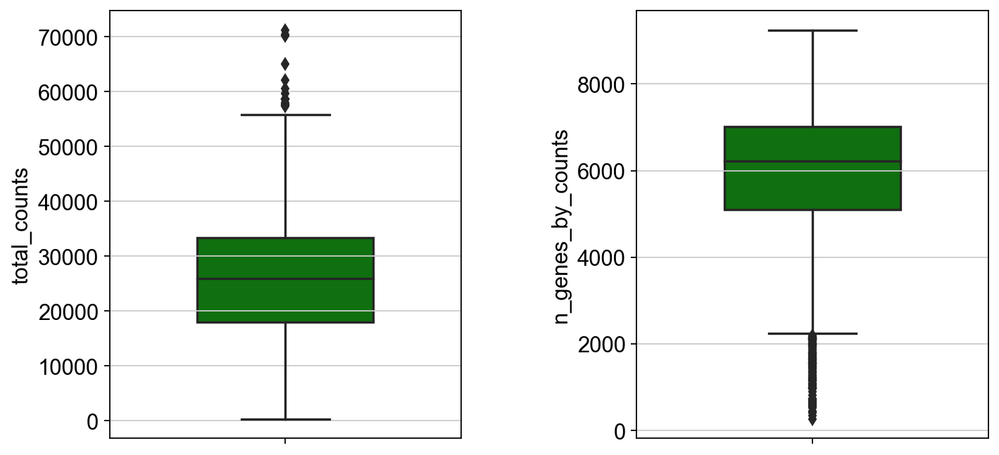

In [3]:
adata = sc.datasets.visium_sge(sample_id = "V1_Mouse_Brain_Sagittal_Anterior")
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars = ["mt"], inplace = True)
DP.FeaturePlot(adata)

Cluster Visium data.

In [4]:
adata_copy = adata.copy()
sc.pp.normalize_total(adata_copy)
sc.pp.log1p(adata_copy)
sc.pp.highly_variable_genes(adata_copy, flavor = "seurat", n_top_genes = 2000)
sc.pp.scale(adata_copy, max_value = 10)
sc.pp.pca(adata_copy)
sc.pp.neighbors(adata_copy, n_neighbors = 20, n_pcs = 30)
sc.tl.umap(adata_copy, n_components = 30)
sc.tl.leiden(adata_copy, resolution = 0.9, key_added = "clusters")

adata.obs["clusters"] = adata_copy.obs.clusters
del adata_copy
gc.collect()

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)
running Leiden clustering
    finished: found 15 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


46470

Visualize clustering results.

In [ ]:
_, ax = plt.subplots(constrained_layout = True, figsize = (8, 6))
sc.pl.spatial(adata, img_key = "hires", size = 1.5, alpha = 0.7, 
              color = "clusters", title = "", show = False, ax = ax)
plt.xlabel("")
plt.ylabel("")
plt.savefig(dirname + "/figure/HEimage.svg", bbox_inches = 'tight')

### Quality Control

Filter genes with total expression less than 10. For other QC, you can refer to `DP.Filter` function.

In [5]:
sc.pp.filter_genes(adata, min_counts = 10)

filtered out 15129 genes that are detected in less than 10 counts


## Making dataset

Globally set the seed.

In [6]:
DP.setup_seed(38)

### Label and feature

Generate total labels.

In [7]:
label_total, distance  = DP.CreateLabel(adata, neighbor_dis = NEIGHBOR_DIS)

Run [SpaGene.R](../spagene.R) to identify spatially variable genes.

In [8]:
DP.adata2seurat(adata, "V1_Mouse_Brain_Sagittal_Anterior")
! Rscript spagene.R V1_Mouse_Brain_Sagittal_Anterior 1000
spagene = DP.find_Spa("data/V1_Mouse_Brain_Sagittal_Anterior/spagene.txt")

Loading required package: ggplot2
Loading required package: patchwork


Normalize, logarithmize and standardize.

In [9]:
adata = DP.data_final(adata, gene = spagene)
count = adata.to_df().values

normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


### Splitting dataset

Select all positive samples and downsample negative samples with a ratio of 1:2.

In [10]:
sample_index = SP.sample_data_index(label_total, neg_size = 2)
label, feature = SP.index2data(label_total, sample_index, count)

Training set and test set.

In [11]:
train_feature, train_label, test_feature, test_label = SP.split_dataset(label, feature)

train_feature = train_feature[:, 2:]
test_index = test_feature[:, [0,1]].astype("int32")
test_feature = test_feature[:, 2:]

## Model comparison

Neural Network

第0轮，训练损失：0.3640
第0轮，验证损失：0.2391
Validation loss decreased (inf --> 0.239072).  Saving model ...
第1轮，训练损失：0.2543
第1轮，验证损失：0.2254
Validation loss decreased (0.239072 --> 0.225403).  Saving model ...
第2轮，训练损失：0.2207
第2轮，验证损失：0.2024
Validation loss decreased (0.225403 --> 0.202416).  Saving model ...
第3轮，训练损失：0.2055
第3轮，验证损失：0.2133
EarlyStopping counter: 1 out of 7
第4轮，训练损失：0.1927
第4轮，验证损失：0.1823
Validation loss decreased (0.202416 --> 0.182265).  Saving model ...
第5轮，训练损失：0.1794
第5轮，验证损失：0.1848
EarlyStopping counter: 1 out of 7
第6轮，训练损失：0.1664
第6轮，验证损失：0.1816
Validation loss decreased (0.182265 --> 0.181577).  Saving model ...
第7轮，训练损失：0.1606
第7轮，验证损失：0.1672
Validation loss decreased (0.181577 --> 0.167179).  Saving model ...
第8轮，训练损失：0.1553
第8轮，验证损失：0.1702
EarlyStopping counter: 1 out of 7
第9轮，训练损失：0.1433
第9轮，验证损失：0.1716
EarlyStopping counter: 2 out of 7
第10轮，训练损失：0.1367
第10轮，验证损失：0.1575
Validation loss decreased (0.167179 --> 0.157462).  Saving model ...
第11轮，训练损失：0.1348
第11轮，验证损失：0.159

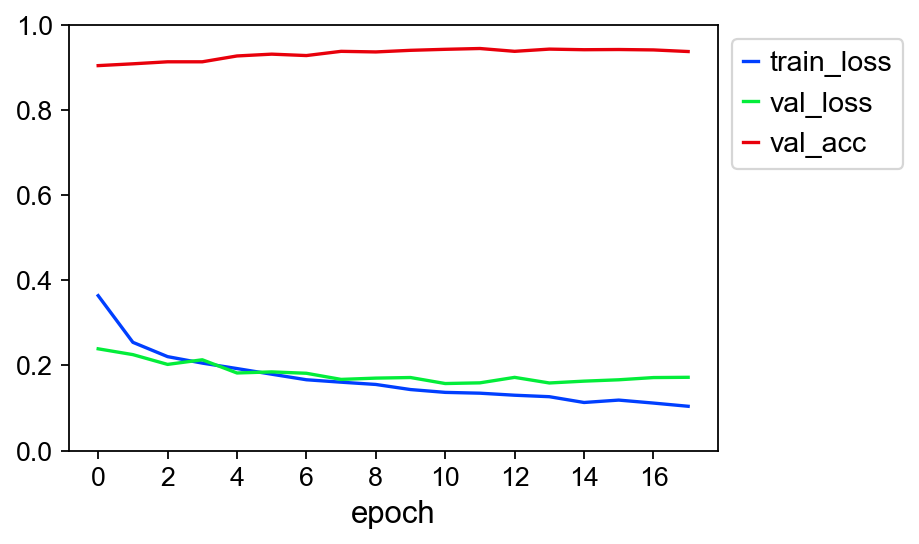

In [12]:
nnmodel = nn_model.NeuralNetworkClassifier(
    num_features = 200, 
    batch_size = 128,
    hidden_layer_sizes = [500, 100],
    dropout_rate = 0.5,
    figname = dirname + "/figure/NN_epoch"
)
nnmodel.fit(train_feature, train_label)
pred_nn = nnmodel.predict(test_feature)
predprob_nn = nnmodel.predict_proba(test_feature)
result_nn = eval.evaluate(test_label, pred_nn, predprob_nn, verbose = False)

XGBoost

In [13]:
start = int(train_feature.shape[1] / 2)
X = np.concatenate(
    (train_feature[:, :200], train_feature[:, start:(start + 200)]),
    1
)
test_X = np.concatenate(
    (test_feature[:, :200], test_feature[:, start:(start + 200)]),
    1
)

In [14]:
xgbmodel = XGBClassifier(
    learning_rate = 0.05,
    n_estimators = 541,
    max_depth = 8,
    min_child_weight = 6,
    gamma = 1,
    colsample_bytree = 0.9,
    subsample = 0.9,
    objective = "binary:logistic"
)
xgbmodel.fit(X, train_label)
pred_xgb = xgbmodel.predict(test_X)
predprob_xgb = xgbmodel.predict_proba(test_X)
result_xgb = eval.evaluate(test_label, pred_xgb, predprob_xgb, verbose = False)

Random Forest

In [15]:
rfmodel = RandomForestClassifier(n_estimators = 380)
rfmodel.fit(X, train_label)
pred_rf = rfmodel.predict(test_X)
predprob_rf = rfmodel.predict_proba(test_X)
result_rf = eval.evaluate(test_label, pred_rf, predprob_rf, verbose = False)

FS+XGBoost

In [16]:
with open(dirname + "/selected_index.pkl", 'rb') as file:
    selected = pickle.load(file)

In [17]:
start = int(train_feature.shape[1] / 2)
train_feature_sel = np.concatenate(
    (train_feature[:, selected], train_feature[:, start + selected]),
    1
)
test_feature_sel = np.concatenate(
    (test_feature[:, selected], test_feature[:, start + selected]),
    1
)

In [18]:
selected_model = XGBClassifier(learning_rate = 0.05, n_estimators = 1000)
selected_model.fit(train_feature_sel, train_label)
pred_sel = selected_model.predict(test_feature_sel)
predprob_sel = selected_model.predict_proba(test_feature_sel)
result_sel = eval.evaluate(test_label, pred_sel, predprob_sel, verbose = False)

Compare the evaluation metrics of models.

In [19]:
eval.model_compare(nnmodel = result_nn, xgbmodel = result_xgb, rfmodel = result_rf, selmodel = result_sel)

,Accuracy,Precision,Recall,MCC,F_Score,AUC,Average Precision
nnmodel,0.941,0.879,0.955,0.872,0.916,0.979,0.944
xgbmodel,0.935,0.863,0.957,0.860,0.907,0.977,0.940
rfmodel,0.898,0.820,0.889,0.776,0.853,0.957,0.886
selmodel,0.922,0.862,0.912,0.828,0.886,0.968,0.912


## Evaluation

Visualize misjudged samples and compare the distance distribution of **FP** and **Negative**.

C:\Users\我只是来搞笑的\AppData\Roaming\Python\Python39\site-packages\scanpy-1.9.1-py3.9.egg\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
C:\Users\我只是来搞笑的\AppData\Roaming\Python\Python39\site-packages\scanpy-1.9.1-py3.9.egg\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


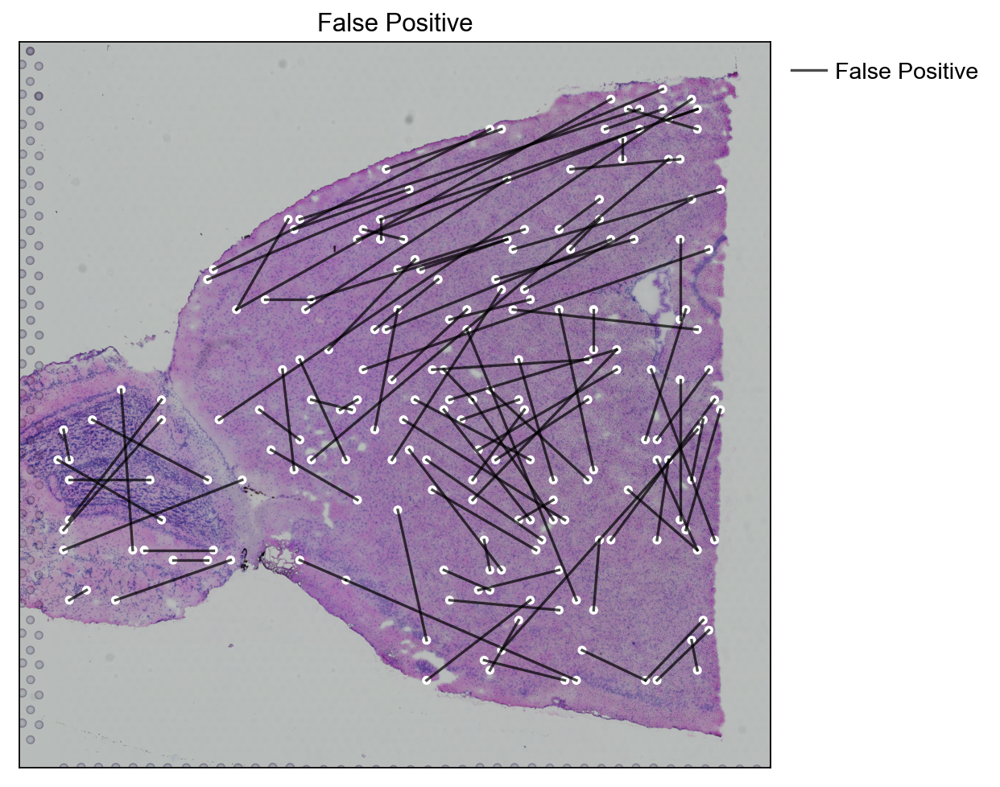

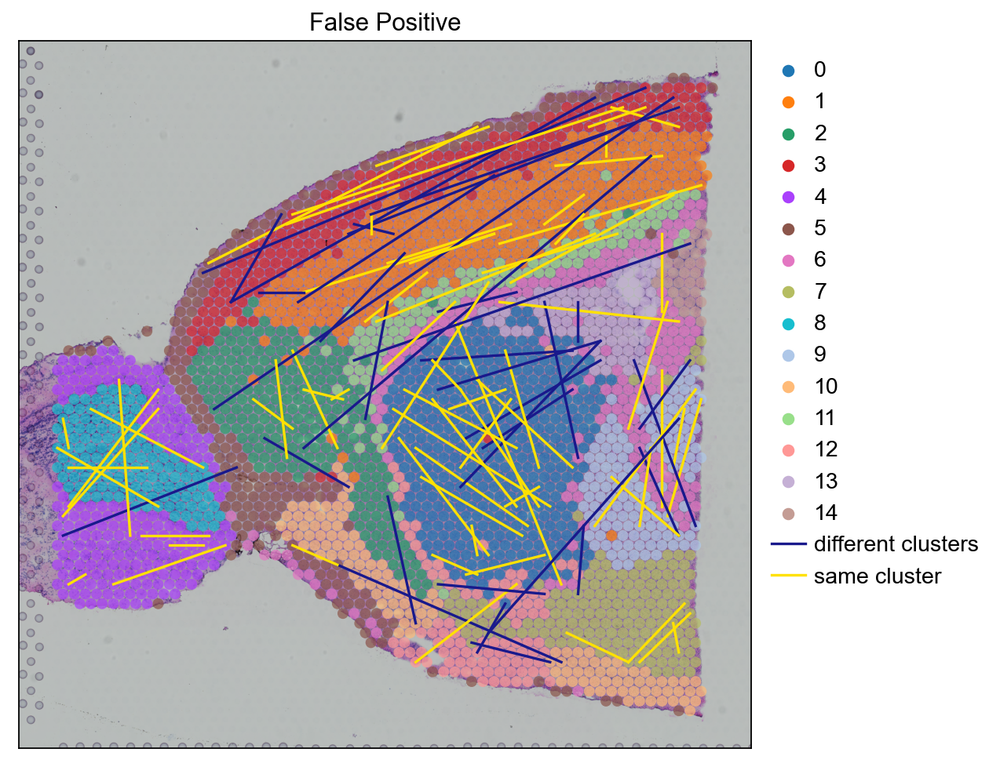

假正例中属于相同簇的点对占比为：68.0%


C:\Users\我只是来搞笑的\AppData\Roaming\Python\Python39\site-packages\scanpy-1.9.1-py3.9.egg\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
C:\Users\我只是来搞笑的\AppData\Roaming\Python\Python39\site-packages\scanpy-1.9.1-py3.9.egg\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


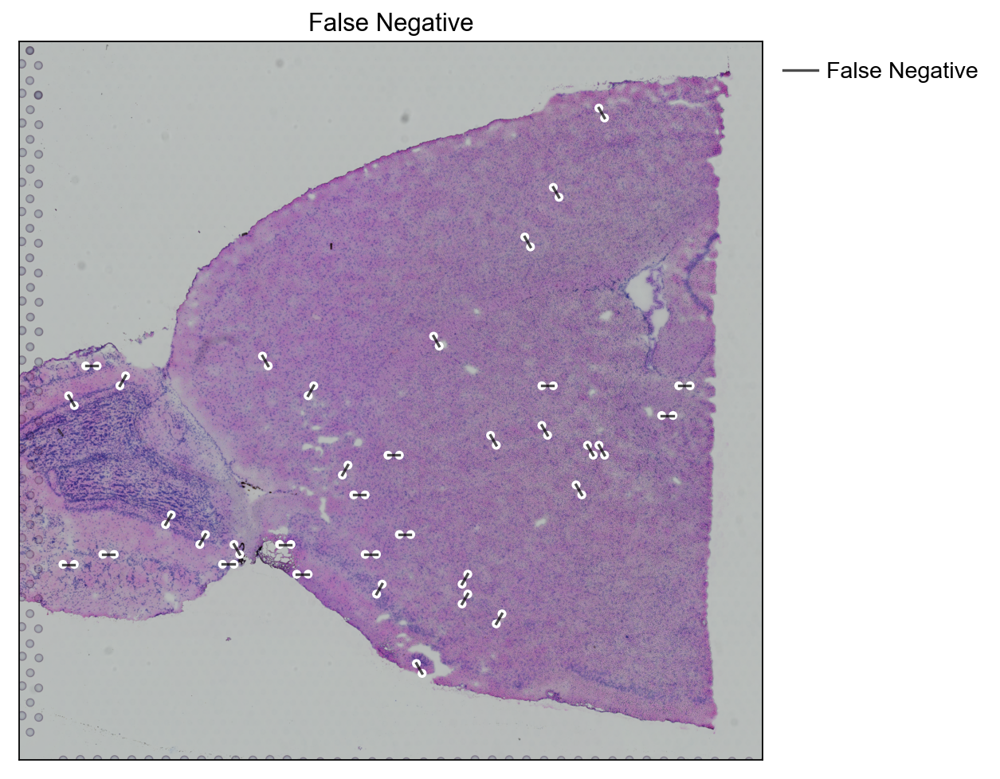

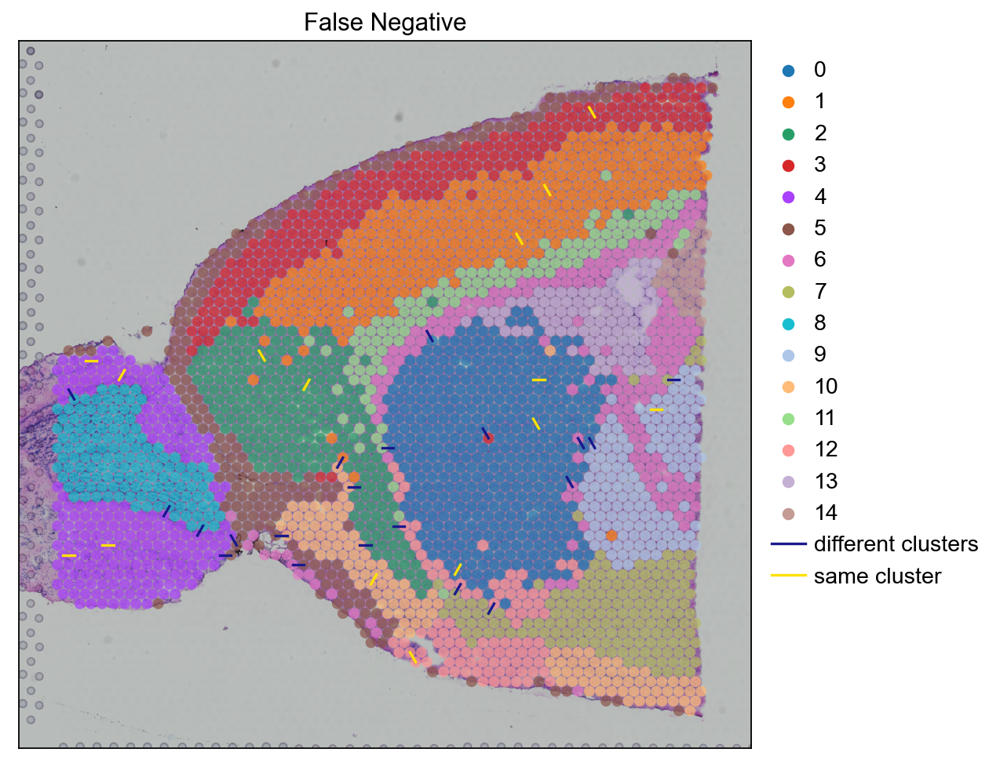

假负例中属于不同簇的点对占比为：57.1%


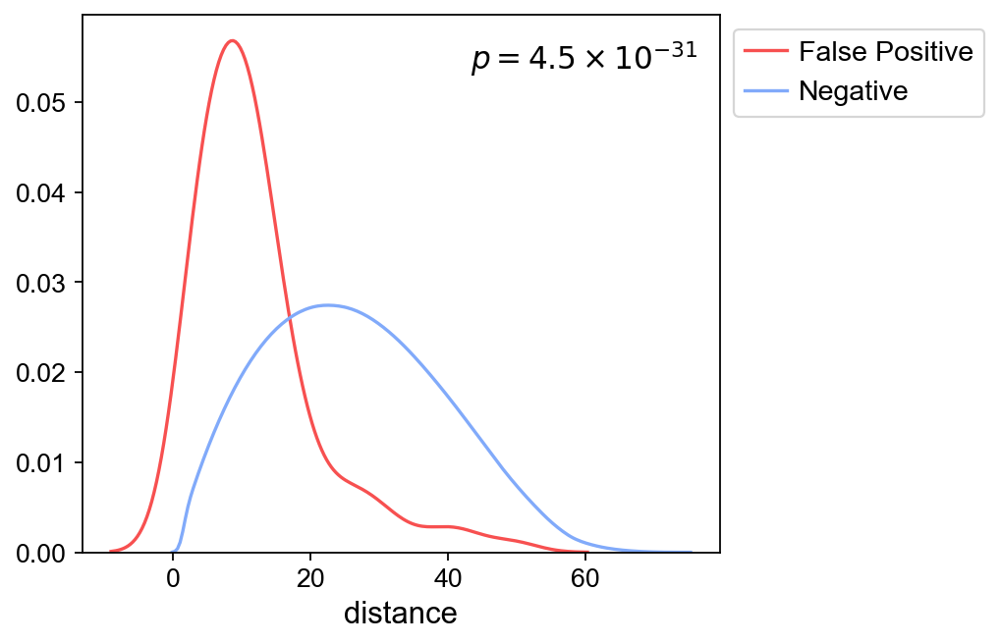

In [21]:
scalefactor = adata.uns["spatial"]['V1_Mouse_Brain_Sagittal_Anterior']["scalefactors"]["tissue_hires_scalef"] 
eval.advance(pred_nn, test_label, test_index, adata, scalefactor, distance, neighbor_dis = NEIGHBOR_DIS,
             dirname = dirname + "/figure")

Prediction of spot pairs belonging to different clusters.

In [22]:
result, pair_diff = eval.edge_evaluate(test_label, pred_nn, predprob_nn, test_index, 
                                        adata, verbose = False)
result

{'Accuracy': 0.9667085427135679,
 'AUC': 0.9908152816764649,
 'Precision': 0.8070175438596491,
 'Recall': 0.8734177215189873,
 'MCC': 0.8211715912662696,
 'F1_Score': 0.8389057750759878,
 'confusion_matrix': array([[1401,   33],
        [  20,  138]], dtype=int64)}

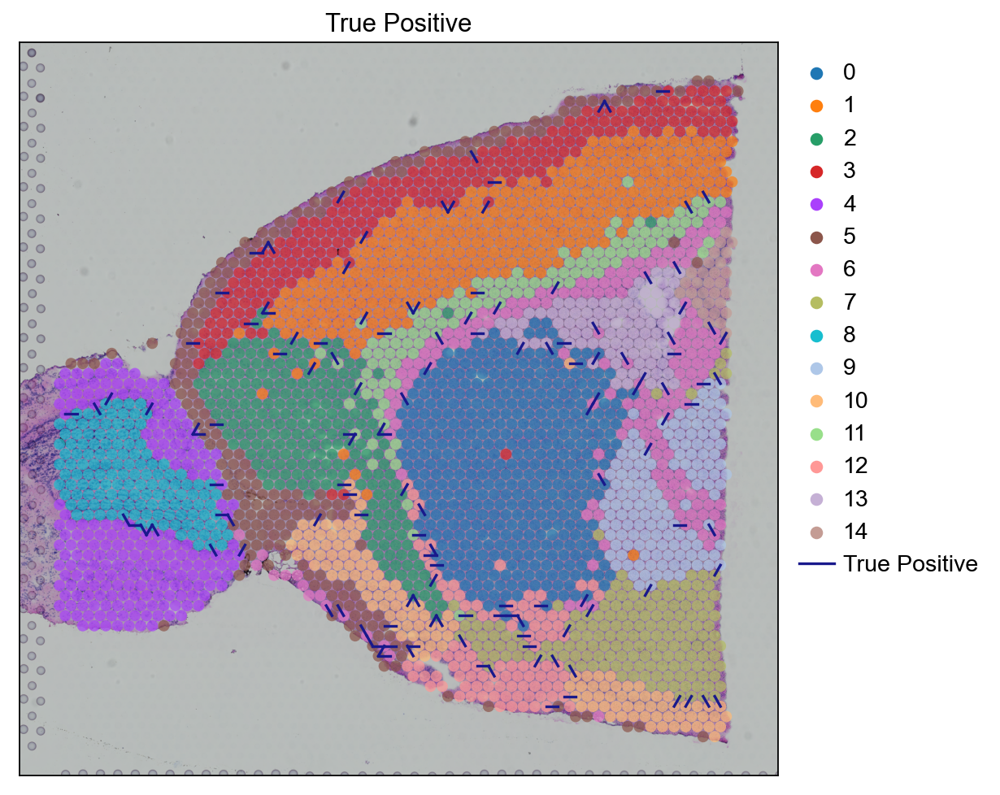

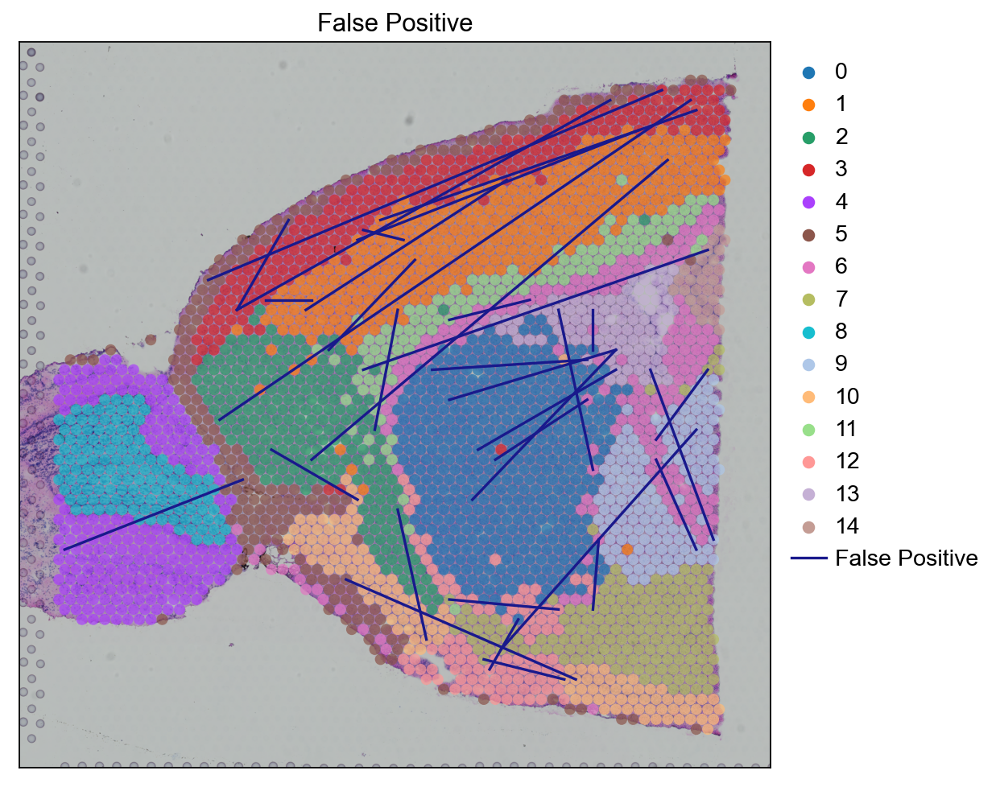

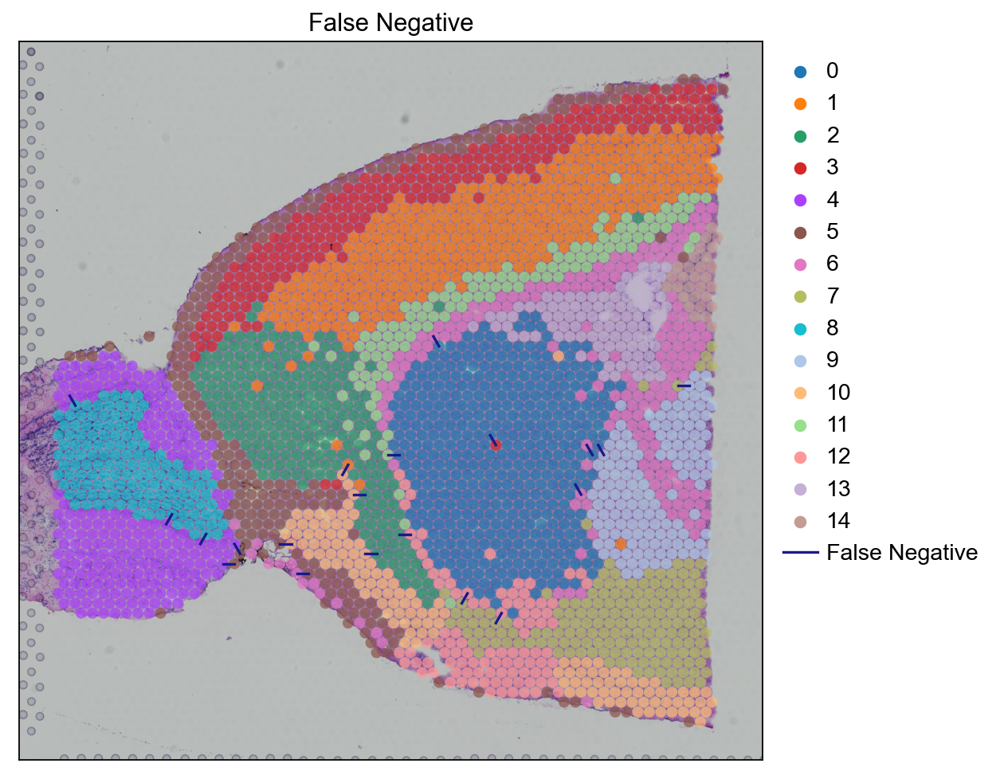

In [23]:
eval.edge_advance(pair_diff, pred_nn, test_label, test_index, adata, scalefactor, dirname = dirname + "/figure")